In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
from plotly import __version__
# print(__version__)
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
import cufflinks as cf
cf.go_offline()

In [3]:
test = pd.read_csv(r'C:\Users\User\Desktop\玉山人工智慧挑戰賽2019夏季賽\test.csv')
train = pd.read_csv(r'C:\Users\User\Desktop\玉山人工智慧挑戰賽2019夏季賽\train.csv')
submit_test = pd.read_csv(r'C:\Users\User\Desktop\玉山人工智慧挑戰賽2019夏季賽\submit_test.csv')

# Preliminary Exploration

## 1. train:
- 羅馬數字：表示「類別」，有Ⅰ、Ⅱ、Ⅲ、Ⅳ、Ⅴ、Ⅵ、Ⅶ、Ⅷ、Ⅸ、Ⅹ、ⅩⅠ、ⅩⅡ、ⅩⅢ、ⅩⅣ。(下方僅以Ⅱ示例，其餘自行類推。)
- 阿拉伯數字：表示「公里」，有10、50、100、250、500、1000、5000、10000。(下方僅以50示例，其餘自行類推。)
- 點位數：表示「建物數量」。因此，Ⅱ類別於該屋方圓50公尺內點位數 = 600，則該屋方圓50公尺內有600間Ⅱ類別的建築。
### ※欄位名稱說明

Field  | Explanation | Field | Explanation | Field  | Explanation
------ | :---------  | :---  | :---------- | :----- | :----------
**building_id** | 建築編號 | **land_area** | 土地面積(經過神秘轉換) | **jobschool_rate** | 所在縣市高中教育程度人口占比
**building_material**| 建材 | **building_area** | 建物面積(經過神秘轉換)| **highschool_rate** | 所在縣市專科學校教育程度人口占比
**city** | 縣市 | **town** | 鄉鎮市區 | **junior_rate** | 所在縣市國中教育程度人口占比
**txn_dt**| 交易日期(距某一特定天之天數差)| **lat**| 	建物緯度(經過神秘轉換)| **elementary_rate** | 所在縣市國小教育程度人口占比
**total_floor**| 總樓層|	**lon**| 建物經度(經過神秘轉換) | **born_rate** | 所在縣市出生率
**building_type** | 建築物型態 | **village_income_median** | 所在里年收入中位數 | **death_rate** | 所在縣市死亡率
**building_use**| 建物用途 | **town_population** | 所在鄉鎮市區人口數 | **marriage_rate** | 所在縣市結婚率
**building_complete_dt** | 建物完成日期(距某一特定天之天數差) | **town_area**| 所在鄉鎮市區面積 | **divorce_rate** | 所在縣市離婚率
**parking_way** | 車位停放方式| **town_population_density** | 所在鄉鎮市區人口密度 | **village**| 村里
**parking_area** | 車位面積(經過神秘轉換) | **doc_rate** | 所在縣市博士教育程度人口占比 | **N_50**| 該屋方圓50公尺內類別種數
**parking_price** | 車位價格(經過神秘轉換) |**master_rate** | 所在縣市碩士教育程度人口占比 | **Ⅱ_50** | Ⅱ類別於該屋方圓50公尺內點位數
**txn_floor**| 交易樓層 | **bachelor_rate**| 所在縣市大學教育程度人口占比	| **Ⅱ\_index_50** | 該屋方圓50公尺內有無Ⅱ類別
 空 | 空 | **total_price** | 總價(經過神秘轉換) | **Ⅱ_MIN** | 該屋與最近Ⅱ類別的距離


In [4]:
train['building_age'] = train['txn_dt'] - train['building_complete_dt']
train.head()

,building_id,building_material,city,txn_dt,total_floor,building_type,building_use,building_complete_dt,parking_way,parking_area,...,XIV_index_500,XIV_1000,XIV_index_1000,XIV_5000,XIV_index_5000,XIV_10000,XIV_index_10000,XIV_MIN,total_price,building_age
0,e3mMIMR3JJqCaXz1,8,21,18674,4,3,2,6271,2,NaN,...,1,157,1,2483,1,6011,1,34.469803,6.476038e+05,12403
1,LgwzgklNvy4QCtq5,8,7,18800,5,1,2,7885,2,NaN,...,1,115,1,15872,1,32221,1,40.073573,3.321452e+06,10915
2,ucIR2NLLsC3T650L,8,7,19289,4,1,2,6028,2,NaN,...,1,212,1,15760,1,32228,1,54.462081,9.570885e+06,13261
3,jre1pJhcQj91Kdky,8,21,20385,24,0,2,18325,0,NaN,...,1,125,1,2568,1,7271,1,99.628966,1.421501e+07,2060
4,rQpYpY9nRG7X5mmr,1,21,20657,2,4,2,6880,2,NaN,...,1,47,1,2587,1,7442,1,124.131236,7.627120e+05,13777


In [5]:
train.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60000 entries, 0 to 59999
Columns: 236 entries, building_id to building_age
dtypes: float64(37), int64(198), object(1)
memory usage: 111.8 MB


In [6]:
train.describe()

,building_material,city,txn_dt,total_floor,building_type,building_use,building_complete_dt,parking_way,parking_area,parking_price,...,XIV_index_500,XIV_1000,XIV_index_1000,XIV_5000,XIV_index_5000,XIV_10000,XIV_index_10000,XIV_MIN,total_price,building_age
count,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,3103.000000,1.393500e+04,...,60000.000000,60000.000000,60000.000000,60000.000000,60000.0,60000.000000,60000.0,60000.000000,6.000000e+04,60000.000000
mean,7.267917,11.414533,19488.957917,7.638250,1.931817,2.319200,11050.437183,1.585700,7.211837,5.025058e+04,...,0.995800,252.823100,0.999867,5276.668033,1.0,16474.836600,1.0,101.044751,1.293727e+07,8438.520733
std,2.170741,4.751677,727.331019,5.070314,1.589972,1.399528,4344.018090,0.778952,20.453902,3.973488e+04,...,0.064672,322.694074,0.011546,3856.219059,0.0,8998.020659,0.0,80.216061,5.522463e+07,4413.447992
min,1.000000,3.000000,18112.000000,1.000000,0.000000,0.000000,123.000000,0.000000,0.000000,0.000000e+00,...,0.000000,0.000000,0.000000,19.000000,1.0,30.000000,1.0,0.064766,2.261495e+05,5.000000
25%,8.000000,7.000000,18892.750000,4.000000,0.000000,2.000000,7186.000000,2.000000,3.738412,2.827238e+04,...,1.000000,88.000000,1.000000,2672.000000,1.0,8859.000000,1.0,49.182384,2.433114e+06,4928.000000
50%,8.000000,12.000000,19527.000000,5.000000,1.000000,2.000000,11507.000000,2.000000,5.758023,4.379195e+04,...,1.000000,154.000000,1.000000,3942.000000,1.0,14344.000000,1.0,83.216237,5.240482e+06,8154.500000
75%,8.000000,13.000000,20125.000000,12.000000,4.000000,2.000000,14519.000000,2.000000,7.180619,6.148857e+04,...,1.000000,275.000000,1.000000,6647.000000,1.0,23459.250000,1.0,130.779416,1.123932e+07,12221.000000
max,11.000000,21.000000,20665.000000,29.000000,4.000000,10.000000,20577.000000,2.000000,967.370868,1.020404e+06,...,1.000000,3463.000000,1.000000,18268.000000,1.0,32908.000000,1.0,1106.382478,5.088279e+09,18287.000000


### Catergorical Columns
Find out all unique values of each categorical column

In [11]:
def show_unique(col_name,table):
    print(col_name,'(',table[col_name].nunique(),'): ', sep='',end='')
    cpy = table[col_name].copy()  # deep copy
    for item in cpy.sort_values().unique():
        print(item, end=', ')
    del cpy
    print()
    
def show_nunique(col_name,table):
    print(col_name,'(',table[col_name].nunique(),'): ', sep='',end='')
    print('\tmax: ',table[col_name].max(),'\tmin: ',table[col_name].min() )

In [12]:
show_unique('building_material',train)
show_unique('city',train)
show_unique('total_floor',train)
show_unique('building_type',train)
show_unique('building_use',train)
show_unique('parking_way',train)
show_nunique('txn_floor',train)
show_nunique('town',train)
show_nunique('village',train)

building_material(9): 1, 3, 4, 5, 7, 8, 9, 10, 11, 
city(11): 3, 5, 6, 7, 9, 10, 12, 13, 14, 17, 21, 
total_floor(29): 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 
building_type(5): 0, 1, 2, 3, 4, 
building_use(10): 0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 
parking_way(3): 0, 1, 2, 
txn_floor(28): 	max:  28.0 	min:  1.0
town(213): 	max:  346 	min:  0
village(2899): 	max:  3377 	min:  0


In [81]:
# create index
outside = 'building_material city total_floor building_type building_use parking_way txn_floor'.split()
outside_ind = list(np.repeat(np.array(outside),2))
inside_ind = ['value','count'] * len(outside_ind)
hier_index = pd.MultiIndex.from_tuples(list(zip(outside_ind, inside_ind)))


# create empty table
length = np.array([train[item].nunique() for item in outside]).max()
data = np.array([np.nan] * len(outside_ind) * length).reshape(len(outside_ind),length)
summary = pd.DataFrame(data=data,index=hier_index).transpose()
summary.head()

# add data
def add_data_from_train(outside, summary):
    val = []
    cnt = []
    for item in outside:
        val.append([idx for idx in train[item].value_counts().index])
        cnt.append([item for item in train[item].value_counts()])

    for idx, item in enumerate(outside):
        for i in range(len(val[idx])):
            summary.loc[i, (item, 'value')] = val[idx][i]
            summary.loc[i, (item, 'count')] = cnt[idx][i]

add_data_from_train(outside, summary)
summary # show the results

building_material           city          total_floor           \
               value    count value    count       value    count   
0                8.0  52609.0   7.0  19664.0         5.0  11244.0   
1                1.0   6372.0  13.0  10756.0         4.0  10647.0   
2               10.0    462.0  21.0   7964.0         2.0   5338.0   
3                7.0    375.0  12.0   7264.0         7.0   4864.0   
4                9.0    167.0  14.0   4704.0         3.0   4490.0   
5                3.0      7.0  10.0   4676.0        12.0   4072.0   
6               11.0      4.0   5.0   1224.0        14.0   3911.0   
7                5.0      2.0   9.0   1125.0        15.0   2099.0   
8                4.0      2.0  17.0    984.0        13.0   1946.0   
9                NaN      NaN   6.0    826.0         8.0   1636.0   
10               NaN      NaN   3.0    813.0        10.0   1401.0   
11               NaN      NaN   NaN      NaN         9.0   1364.0   
12               NaN      NaN   NaN      NaN         6.0   1345.0   
13               NaN      NaN   NaN      NaN        11.0   1327.0   
14               NaN      NaN   NaN      NaN        16.0   1017.0   
15               NaN      NaN   NaN      NaN        19.0    519.0   
16               NaN      NaN   NaN      NaN        17.0    482.0   
17               NaN      NaN   NaN      NaN        18.0    376.0   
18               NaN      NaN   NaN      NaN        22.0    298.0   
19               NaN      NaN   NaN      NaN        20.0    291.0   
20               NaN      NaN   NaN      NaN         1.0    281.0   
21               NaN      NaN   NaN      NaN        24.0    260.0   
22               NaN      NaN   NaN      NaN        21.0    231.0   
23               NaN      NaN   NaN      NaN        23.0    224.0   
24               NaN      NaN   NaN      NaN        25.0    130.0   
25               NaN      NaN   NaN      NaN        28.0     97.0   
26               NaN      NaN   NaN      NaN        26.0     84.0   
27               NaN      NaN   NaN      NaN        27.0     24.0   
28               NaN      NaN   NaN      NaN        29.0      2.0   

   building_type          building_use          parking_way           \
           value    count        value    count       value    count   
0            4.0  15902.0          2.0  51312.0         2.0  46065.0   
1            0.0  15691.0          1.0   3069.0         0.0  10923.0   
2            1.0  15049.0          5.0   2575.0         1.0   3012.0   
3            3.0  10536.0          8.0   1014.0         NaN      NaN   
4            2.0   2822.0          6.0    752.0         NaN      NaN   
5            NaN      NaN         10.0    722.0         NaN      NaN   
6            NaN      NaN          0.0    369.0         NaN      NaN   
7            NaN      NaN          3.0    119.0         NaN      NaN   
8            NaN      NaN          7.0     37.0         NaN      NaN   
9            NaN      NaN          4.0     31.0         NaN      NaN   
10           NaN      NaN          NaN      NaN         NaN      NaN   
11           NaN      NaN          NaN      NaN         NaN      NaN   
12           NaN      NaN          NaN      NaN         NaN      NaN   
13           NaN      NaN          NaN      NaN         NaN      NaN   
14           NaN      NaN          NaN      NaN         NaN      NaN   
15           NaN      NaN          NaN      NaN         NaN      NaN   
16           NaN      NaN          NaN      NaN         NaN      NaN   
17           NaN      NaN          NaN      NaN         NaN      NaN   
18           NaN      NaN          NaN      NaN         NaN      NaN   
19           NaN      NaN          NaN      NaN         NaN      NaN   
20           NaN      NaN          NaN      NaN         NaN      NaN   
21           NaN      NaN          NaN      NaN         NaN      NaN   
22           NaN      NaN          NaN      NaN         NaN      NaN   
23           NaN      NaN          NaN      NaN         NaN    

##### From the above summary, we can see each unique values and its counts for each categorical column.

## 2. test
### ---- *We are supposed to predict the total\_price for each building in test data*
- 羅馬數字：表示「類別」，有Ⅰ、Ⅱ、Ⅲ、Ⅳ、Ⅴ、Ⅵ、Ⅶ、Ⅷ、Ⅸ、Ⅹ、ⅩⅠ、ⅩⅡ、ⅩⅢ、ⅩⅣ。(下方僅以Ⅱ示例，其餘自行類推。)
- 阿拉伯數字：表示「公里」，有10、50、100、250、500、1000、5000、10000。(下方僅以50示例，其餘自行類推。)
- 點位數：表示「建物數量」。因此，Ⅱ類別於該屋方圓50公尺內點位數 = 600，則該屋方圓50公尺內有600間Ⅱ類別的建築。
### ※欄位名稱說明

Field  | Explanation | Field | Explanation | Field  | Explanation
------ | :---------  | :---  | :---------- | :----- | :----------
**building_id** | 建築編號 | **land_area** | 土地面積(經過神秘轉換) | **jobschool_rate** | 所在縣市高中教育程度人口占比
**building_material**| 建材 | **building_area** | 建物面積(經過神秘轉換)| **highschool_rate** | 所在縣市專科學校教育程度人口占比
**city**|縣市| **town**|鄉鎮市區|  **junior_rate**|  所在縣市國中教育程度人口占比
**txn_dt**| 交易日期(距某一特定天之天數差)| **lat**| 	建物緯度(經過神秘轉換)| **elementary_rate** | 所在縣市國小教育程度人口占比
**total_floor**| 總樓層|	**lon**| 建物經度(經過神秘轉換) | **born_rate** | 所在縣市出生率
**building_type** | 建築物型態 | **village_income_median** | 所在里年收入中位數 | **death_rate** | 所在縣市死亡率
**building_use**| 建物用途 | **town_population** | 所在鄉鎮市區人口數 | **marriage_rate** | 所在縣市結婚率
**building_complete_dt** | 建物完成日期(距某一特定天之天數差) | **town_area**| 所在鄉鎮市區面積 | **divorce_rate** | 所在縣市離婚率
**parking_way** | 車位停放方式| **town_population_density** | 所在鄉鎮市區人口密度 | **village**| 村里
**parking_area** | 車位面積(經過神秘轉換) | **doc_rate** | 所在縣市博士教育程度人口占比 | **N_50**| 該屋方圓50公尺內類別種數
**parking_price** | 車位價格(經過神秘轉換) |**master_rate** | 所在縣市碩士教育程度人口占比 | **Ⅱ_50** | Ⅱ類別於該屋方圓50公尺內點位數
**txn_floor**| 交易樓層 | **bachelor_rate**| 所在縣市大學教育程度人口占比	| **Ⅱ\_index_50** | 該屋方圓50公尺內有無Ⅱ類別
 空 | 空 | 空 | 空 | **Ⅱ_MIN** | 該屋與最近Ⅱ類別的距離


In [82]:
test.head()

,building_id,building_material,city,txn_dt,total_floor,building_type,building_use,building_complete_dt,parking_way,parking_area,...,XIV_250,XIV_500,XIV_index_500,XIV_1000,XIV_index_1000,XIV_5000,XIV_index_5000,XIV_10000,XIV_index_10000,XIV_MIN
0,X5gsdTWGS3W7JJQB,1,13,18634,2,4,2,1857,2,NaN,...,7,21,1,129,1,3991,1,8409,1,105.462231
1,BTshNOJyKHnT2YIT,8,7,20199,10,3,2,16011,2,NaN,...,18,44,1,67,1,1950,1,10725,1,100.819809
2,dhdymr0lV8N5kZOT,8,12,19769,4,4,10,18294,2,NaN,...,0,3,1,35,1,3707,1,19459,1,259.800543
3,VEwyGGMcD56w5BOc,10,7,20479,19,2,0,17837,2,NaN,...,16,60,1,144,1,6487,1,29400,1,22.941906
4,wmUeMoJZfsqaSX9b,8,3,18164,13,0,2,13272,2,NaN,...,4,18,1,76,1,1346,1,3280,1,181.213095


In [83]:
test.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Columns: 234 entries, building_id to XIV_MIN
dtypes: float64(36), int64(197), object(1)
memory usage: 18.5 MB


In [84]:
test.describe()

,building_material,city,txn_dt,total_floor,building_type,building_use,building_complete_dt,parking_way,parking_area,parking_price,...,XIV_250,XIV_500,XIV_index_500,XIV_1000,XIV_index_1000,XIV_5000,XIV_index_5000,XIV_10000,XIV_index_10000,XIV_MIN
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,500.000000,2290.000000,...,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.00000,10000.0,10000.000000,10000.0,10000.000000
mean,7.267800,11.408200,19490.418600,7.613600,1.935700,2.343600,11040.909900,1.58970,6.645918,50600.021883,...,14.862900,60.588400,0.995300,250.80290,0.999800,5217.24350,1.0,16330.445700,1.0,100.893000
std,2.178017,4.766408,729.350707,5.035755,1.585817,1.437409,4310.391506,0.77757,6.671072,38948.800177,...,27.498406,88.746682,0.068399,321.94302,0.014141,3816.06562,0.0,8956.747178,0.0,80.168798
min,1.000000,3.000000,18113.000000,1.000000,0.000000,0.000000,732.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.00000,0.000000,86.00000,1.0,402.000000,1.0,0.033160
25%,8.000000,7.000000,18894.000000,4.000000,0.000000,2.000000,7186.000000,2.00000,3.738412,28272.384431,...,4.000000,20.000000,1.000000,86.00000,1.000000,2658.00000,1.0,8767.000000,1.0,49.723905
50%,8.000000,12.000000,19524.000000,5.000000,1.000000,2.000000,11507.000000,2.00000,5.758023,43791.947141,...,8.000000,36.000000,1.000000,154.00000,1.000000,3898.00000,1.0,14209.500000,1.0,82.710367
75%,8.000000,13.000000,20124.000000,12.000000,4.000000,2.000000,14345.500000,2.00000,7.180619,61488.568950,...,16.000000,64.000000,1.000000,275.00000,1.000000,6601.25000,1.0,23210.000000,1.0,129.718101
max,11.000000,21.000000,20665.000000,29.000000,4.000000,10.000000,20516.000000,2.00000,103.895538,326960.895420,...,523.000000,1461.000000,1.000000,3177.00000,1.000000,18242.00000,1.0,32903.000000,1.0,1089.068319


### Categorical Columns

In [12]:
show_unique('building_material',test)
show_unique('city',test)
show_unique('total_floor',test)
show_unique('building_type',test)
show_unique('building_use',test)
show_unique('parking_way',test)
show_nunique('txn_floor',test)
show_nunique('town',test)
show_nunique('village',test)

# The result of 'train' is:
# building_material(9): 1, 3, 4, 5, 7, 8, 9, 10, 11, 
# city(11): 3, 5, 6, 7, 9, 10, 12, 13, 14, 17, 21, 
# total_floor(29): 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 
# building_type(5): 0, 1, 2, 3, 4, 
# building_use(10): 0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 
# parking_way(3): 0, 1, 2, 
# txn_floor(28): 	max:  28.0 	min:  1.0
# town(213): 	max:  346 	min:  0
# village(2899): 	max:  3377 	min:  0

building_material(8): 1, 3, 4, 7, 8, 9, 10, 11, 
city(11): 3, 5, 6, 7, 9, 10, 12, 13, 14, 17, 21, 
total_floor(29): 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 
building_type(5): 0, 1, 2, 3, 4, 
building_use(10): 0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 
parking_way(3): 0, 1, 2, 
txn_floor(27): 	max:  27.0 	min:  1.0
town(178): 	max:  346 	min:  0
village(2179): 	max:  3377 	min:  0


## 3. submit_test

In [13]:
submit_test # the first column is test['building_id']

,building_id,total_price
0,X5gsdTWGS3W7JJQB,0
1,BTshNOJyKHnT2YIT,0
2,dhdymr0lV8N5kZOT,0
3,VEwyGGMcD56w5BOc,0
4,wmUeMoJZfsqaSX9b,0
5,EtBjGAHmHCe9t7TZ,0
6,hPNH34vmaZtvBtqc,0
7,wXjeI38bYDMJJwZC,0
8,fxZSGX6aPAFKU8W4,0
9,ewr0Fx6ign87OwaV,0


# Exploration on "Time"
##### Columns: 'txn_dt', 'building_complete_dt'

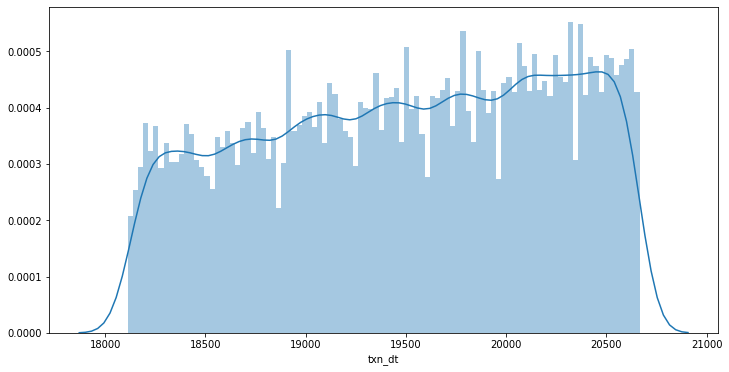

In [85]:
plt.figure(figsize=(12,6))
sns.distplot(train['txn_dt'], bins=100) # 看似有「景氣循環」

In [87]:
train['txn_dt'].iplot(kind='hist', bins=500)

<Figure size 864x576 with 0 Axes>

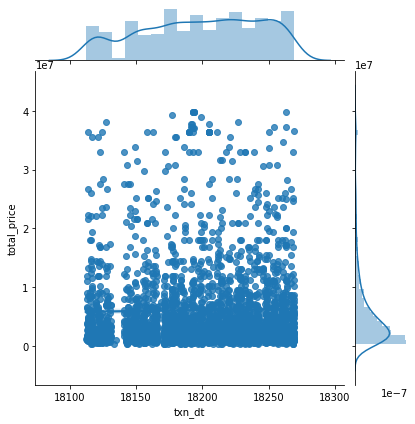

In [88]:
temp = train[['txn_dt','total_price']].sort_values(by='txn_dt')
plt.figure(figsize=(12,8))
sns.jointplot(x='txn_dt',y='total_price',data=temp[(temp['txn_dt']<18270)&(temp['total_price']<40000000)],kind='reg')

In [35]:
# train.iplot(kind='scatter',x='txn_dt',y='total_price',mode='markers')

In [90]:
# plt.figure(figsize=(6,12))
# sns.jointplot(x='txn_dt',y='total_price',data=train,kind='reg')

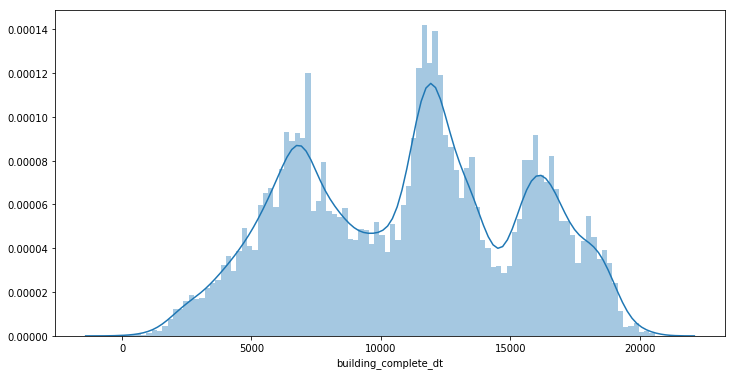

In [91]:
plt.figure(figsize=(12,6))
sns.distplot(train['building_complete_dt'], bins=100) # 看似有「景氣循環」

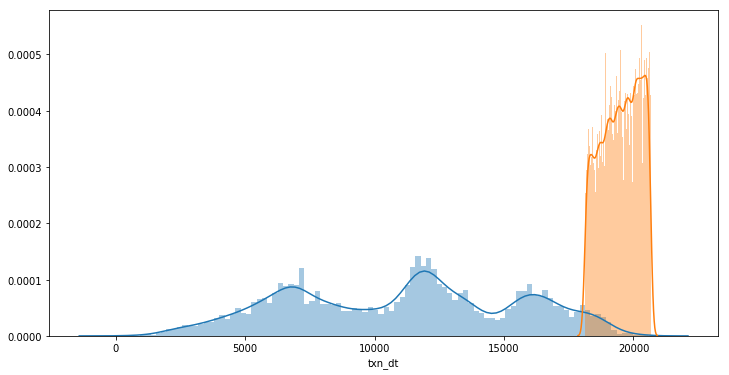

In [100]:
plt.figure(figsize=(12,6))
sns.distplot(train['building_complete_dt'], bins=100) # 看似有「景氣循環」
sns.distplot(train['txn_dt'], bins=100) # 看似有「景氣循環」
# sns.distplot(train['building_age'], bins=100)

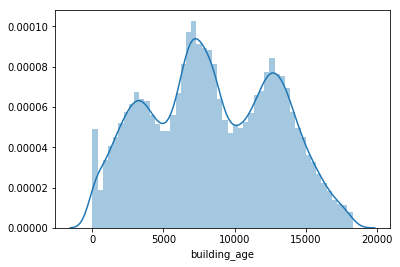

In [105]:
sns.distplot(train['building_age'])

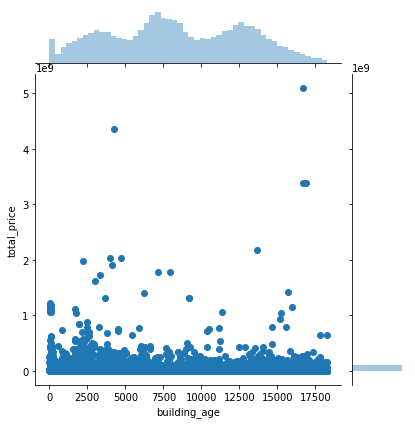

In [96]:
sns.jointplot(x='building_age',y='total_price',data=train)

In [24]:
train

,building_id,building_material,city,txn_dt,total_floor,building_type,building_use,building_complete_dt,parking_way,parking_area,...,XIV_1000,XIV_index_1000,XIV_5000,XIV_index_5000,XIV_10000,XIV_index_10000,XIV_MIN,total_price,building_age,complete_week
0,e3mMIMR3JJqCaXz1,8,21,18674,4,3,2,6271,2,NaN,...,157,1,2483,1,6011,1,34.469803,6.476038e+05,12403,1045
1,LgwzgklNvy4QCtq5,8,7,18800,5,1,2,7885,2,NaN,...,115,1,15872,1,32221,1,40.073573,3.321452e+06,10915,1314
2,ucIR2NLLsC3T650L,8,7,19289,4,1,2,6028,2,NaN,...,212,1,15760,1,32228,1,54.462081,9.570885e+06,13261,1004
3,jre1pJhcQj91Kdky,8,21,20385,24,0,2,18325,0,NaN,...,125,1,2568,1,7271,1,99.628966,1.421501e+07,2060,3054
4,rQpYpY9nRG7X5mmr,1,21,20657,2,4,2,6880,2,NaN,...,47,1,2587,1,7442,1,124.131236,7.627120e+05,13777,1146
5,HmW2MkrwafmceWAH,8,21,18394,5,1,2,6576,2,NaN,...,314,1,2725,1,7417,1,61.109908,3.964520e+05,11818,1096
6,ITYyim3zx6DQyCoF,8,7,20474,15,0,2,16559,0,NaN,...,252,1,11515,1,26867,1,196.690224,8.510296e+06,3915,2759
7,KFrxqaWZaLynrOae,8,12,18185,8,3,2,11934,1,NaN,...,181,1,11456,1,19514,1,66.780308,1.678426e+06,6251,1989
8,ZiK0gY7A0BvwZ8OV,8,21,18794,5,1,2,7640,2,NaN,...,203,1,2666,1,7014,1,40.349486,9.870214e+05,11154,1273
9,QnytA7FbgaVxIDuP,8,7,19927,10,3,2,9863,0,NaN,...,288,1,12945,1,32664,1,102.955013,1.181540e+07,10064,1643


In [15]:
def without_rome(train):
    for col in train.columns:
        if ('I' in col) or ('V' in col) or ('X' in col) or ('N' in col):
            train.drop(columns=col,inplace=True)
    return train
train_NoRome = without_rome(train.copy())
train_NoRome

,building_id,building_material,city,txn_dt,total_floor,building_type,building_use,building_complete_dt,parking_way,parking_area,...,highschool_rate,junior_rate,elementary_rate,born_rate,death_rate,marriage_rate,divorce_rate,village,total_price,building_age
0,e3mMIMR3JJqCaXz1,8,21,18674,4,3,2,6271,2,NaN,...,0.327584,0.166931,0.143015,7.37,7.72,5.74,2.39,3132,6.476038e+05,12403
1,LgwzgklNvy4QCtq5,8,7,18800,5,1,2,7885,2,NaN,...,0.310975,0.195193,0.118700,7.94,5.93,6.11,2.50,921,3.321452e+06,10915
2,ucIR2NLLsC3T650L,8,7,19289,4,1,2,6028,2,NaN,...,0.310975,0.195193,0.118700,7.94,5.93,6.11,2.50,1544,9.570885e+06,13261
3,jre1pJhcQj91Kdky,8,21,20385,24,0,2,18325,0,NaN,...,0.327584,0.166931,0.143015,7.37,7.72,5.74,2.39,3350,1.421501e+07,2060
4,rQpYpY9nRG7X5mmr,1,21,20657,2,4,2,6880,2,NaN,...,0.327584,0.166931,0.143015,7.37,7.72,5.74,2.39,63,7.627120e+05,13777
5,HmW2MkrwafmceWAH,8,21,18394,5,1,2,6576,2,NaN,...,0.327584,0.166931,0.143015,7.37,7.72,5.74,2.39,2950,3.964520e+05,11818
6,ITYyim3zx6DQyCoF,8,7,20474,15,0,2,16559,0,NaN,...,0.310975,0.195193,0.118700,7.94,5.93,6.11,2.50,1591,8.510296e+06,3915
7,KFrxqaWZaLynrOae,8,12,18185,8,3,2,11934,1,NaN,...,0.324623,0.175041,0.121459,8.79,6.12,6.26,2.29,1331,1.678426e+06,6251
8,ZiK0gY7A0BvwZ8OV,8,21,18794,5,1,2,7640,2,NaN,...,0.327584,0.166931,0.143015,7.37,7.72,5.74,2.39,3077,9.870214e+05,11154
9,QnytA7FbgaVxIDuP,8,7,19927,10,3,2,9863,0,NaN,...,0.310975,0.195193,0.118700,7.94,5.93,6.11,2.50,2122,1.181540e+07,10064


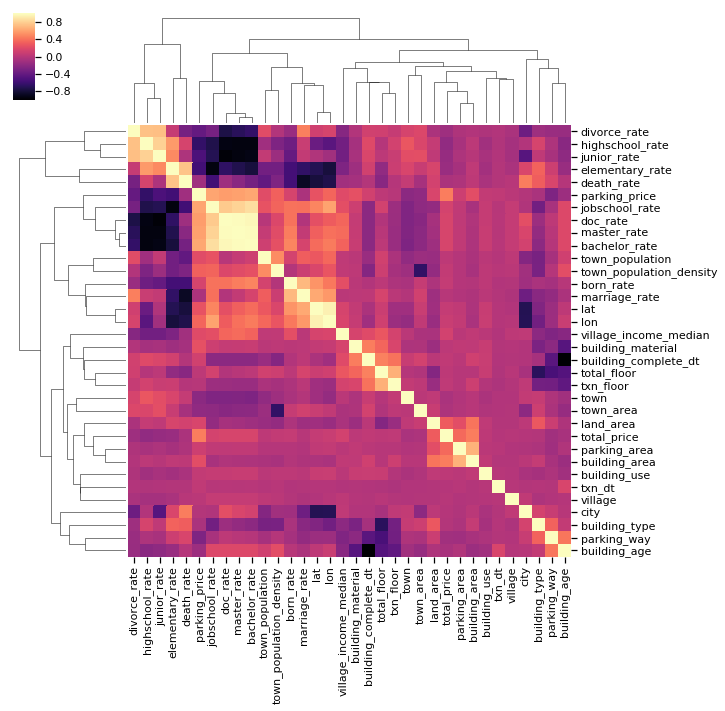

In [35]:
# sns.set_context(context='notebook')
sns.clustermap(train_NoRome.corr(),cmap='magma')

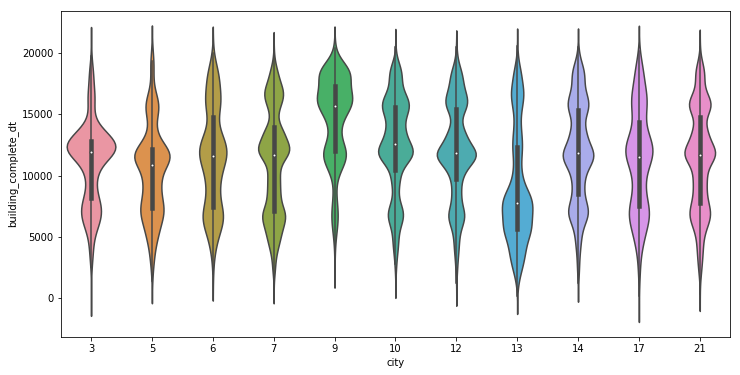

In [77]:
plt.figure(figsize=(12,6))
sns.violinplot(x='city',y='building_complete_dt',data=train,kind='reg')

In [22]:
def summarize_dt(train):
    lst = []
    for dt in train['building_complete_dt']:
        lst.append(int(dt/6))
    train['complete_week'] = pd.Series(lst)

summarize_dt(train)

In [1]:
# sorted(train,key=lambda x: (x['city'],x['complete_week']))

# Exploration on "Place"
##### Columns: 'city', 'town', 'village', 'lat', 'lon'

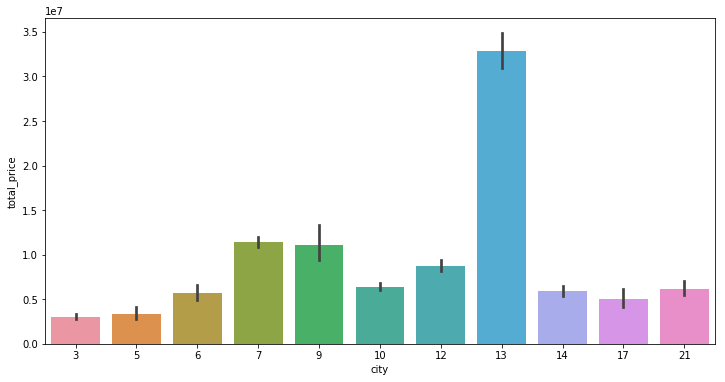

In [142]:
plt.figure(figsize=(12,6))
sns.barplot(x='city',y='total_price',data=train)

In [116]:
train.groupby('town').mean()[['city','total_price']].sort_values(by='city')

,city,total_price
town,,
0,3.0,3.703952e+06
169,3.0,2.066671e+06
122,3.0,2.665845e+06
27,3.0,2.903525e+06
38,5.0,1.796805e+06
280,5.0,9.029668e+05
279,5.0,7.406433e+06
259,5.0,9.882424e+05
63,5.0,1.065351e+06


In [138]:
train.groupby('town')

# Exploration on 'Building Attributes'
##### Columns: 'building_material', 'building_type', 'building_use', 'total_floor', 'txn_floor', 'parking_way', 'parking_area', 'parking_price', 'land_area', 'building_area'

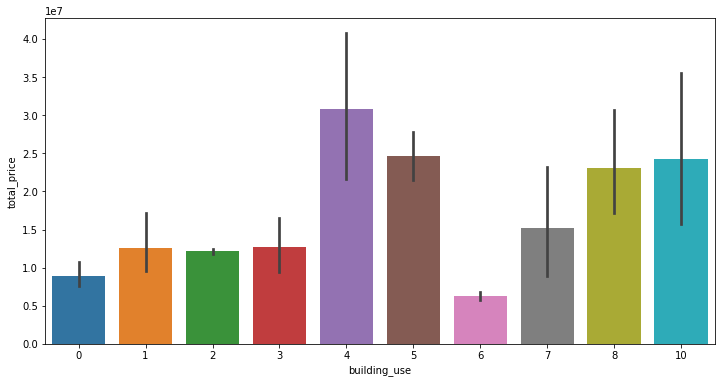

In [78]:
plt.figure(figsize=(12,6))
sns.barplot(x='building_use',y='total_price',data=train)

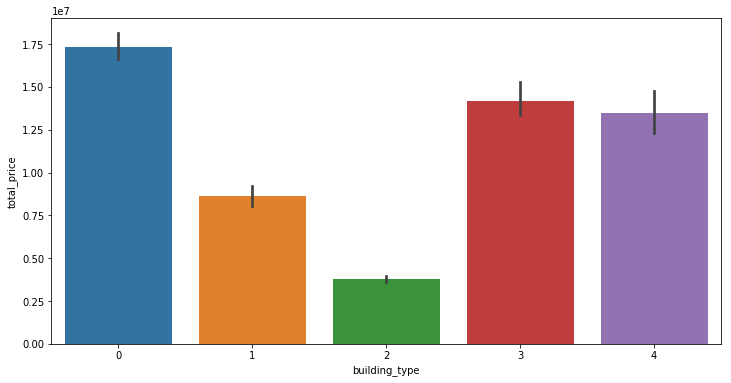

In [79]:
plt.figure(figsize=(12,6))
sns.barplot(x='building_type',y='total_price',data=train)

In [ ]:
plt.figure(figsize=(12,6))
sns.swarmplot(x='building_material',y='total_price',data=train)

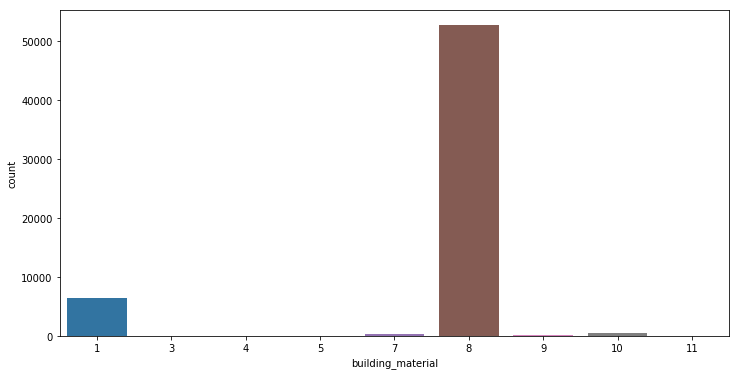

In [98]:
plt.figure(figsize=(12,6))
sns.countplot(x='building_material',data=train)

<Figure size 576x432 with 0 Axes>

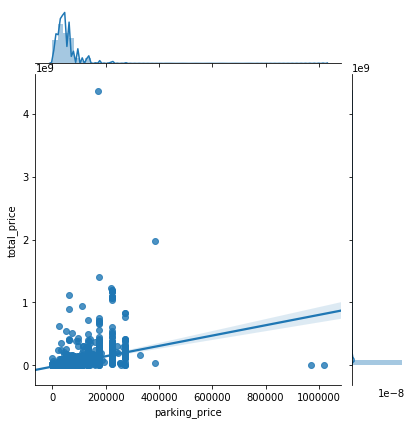

In [122]:
plt.figure(figsize=(8,6))
sns.jointplot('parking_price','total_price',data=train,kind='reg')

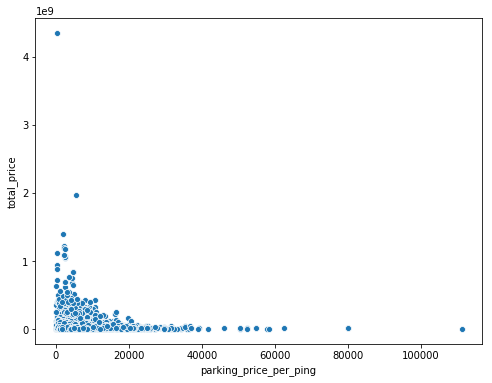

In [141]:
plt.figure(figsize=(8,6))
sns.scatterplot('parking_price_per_ping','total_price',data=train)

# Target Column: total_price

In [11]:
train['total_price'].describe()

count    6.000000e+04
mean     1.293727e+07
std      5.522463e+07
min      2.261495e+05
25%      2.433114e+06
50%      5.240482e+06
75%      1.123932e+07
max      5.088279e+09
Name: total_price, dtype: float64

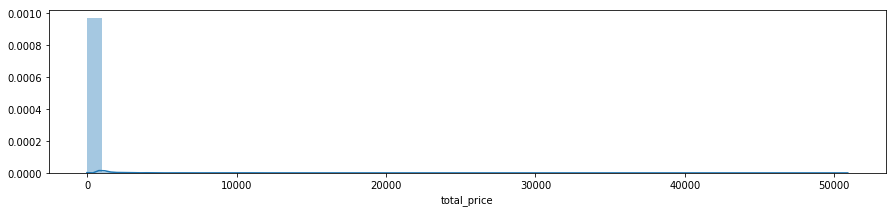

In [13]:
plt.figure(figsize=(15,3))
sns.distplot(train['total_price'].apply(lambda x: x/100000)) # 非常的左偏...

In [ ]:
plt.figure(figsize=(25,25))
sns.heatmap(train_NoRome.corr(),annot=True,cmap='RdYlGn')

<Figure size 2160x2160 with 0 Axes>

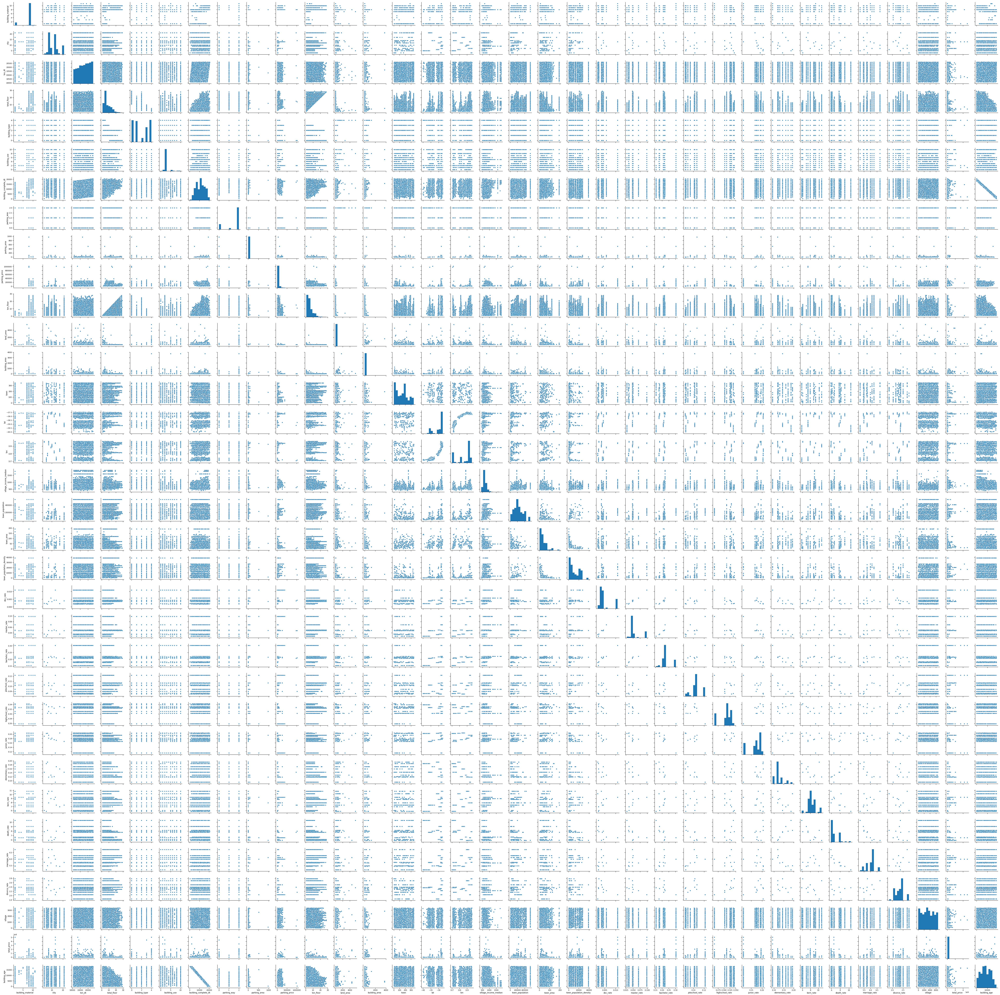

In [41]:
plt.figure(figsize=(30,30))
sns.pairplot(train_NoRome)

In [44]:
# plt.figure(figsize=(30,30))
# train_NoRome.scatter_matrix()